<a href="https://colab.research.google.com/github/sangeetsaurabh/tweet_sentiment_extraction/blob/master/pca_and_t_sne_embedding_calculations_and_visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### Mount the Google Drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
data_folder = "/content/drive/My Drive/tweet-sentiment-extraction/data"
tmp_folder = '/tmp'

In [4]:
import pandas as pd
import numpy as np
import json
import zipfile
import os
import time

from sklearn import preprocessing
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

In [5]:
embedding_data = pd.read_csv(data_folder + '/embedding.csv', sep=',',header=None)
embedding_labels = pd.read_csv(data_folder + '/embedding_labels.csv',header=None)
embedding_data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
0,-0.308995,-0.152197,-0.046149,0.202753,0.469923,-0.266506,0.078062,0.397224,-0.033179,0.202374,-0.475220,0.281379,0.094367,-0.121045,-0.180528,-0.202585,0.341084,0.373142,-0.354224,0.468517,0.314719,0.022714,0.380168,0.176435,0.252044,0.098343,0.299842,0.432043,-0.065869,0.202232,-0.293310,0.206443
1,-0.388390,0.198290,0.454922,0.194158,-0.191094,0.049984,-0.423012,-0.144758,-0.080555,0.017902,-0.290310,-0.380500,0.249315,0.025900,0.470360,-0.379056,-0.075518,0.213910,-0.280830,-0.492887,-0.342286,-0.243085,0.120098,0.106073,-0.406084,-0.159911,0.004010,0.045717,0.032660,-0.389284,0.042825,0.195204
2,0.448120,0.296789,0.179553,-0.238895,0.172054,0.397958,-0.302498,-0.087420,-0.341480,0.354808,0.278856,0.378666,-0.195917,-0.043077,-0.545747,0.007089,0.033179,-0.014894,-0.065809,0.193399,0.218240,0.223124,-0.100248,0.060703,0.318348,0.042403,0.087310,-0.461328,-0.347453,-0.044986,-0.392613,0.265040
3,-0.230624,-0.054158,0.144566,0.195801,-0.146795,-0.168675,0.171923,0.028248,0.467817,-0.241719,-0.206425,-0.273543,-0.246705,-0.062774,0.240587,-0.142763,0.036027,0.198725,0.287953,-0.172778,0.003374,0.195536,0.050891,0.256270,-0.251219,-0.259675,-0.051823,0.291727,0.385842,-0.083367,0.153909,0.016197
4,-0.261458,0.090347,0.151423,0.251639,0.129100,-0.140457,-0.017305,-0.135394,0.286703,0.200539,0.019062,0.120055,0.067644,0.233913,-0.158533,0.012548,0.182552,-0.226173,0.012032,0.134314,-0.049298,-0.278979,0.180022,-0.060198,-0.078208,-0.086583,-0.093326,0.067231,-0.168703,-0.021902,0.026096,-0.007066


In [6]:
print(embedding_data.shape)
print(embedding_labels.shape)

(18956, 32)
(18956, 1)


#### Scale the variables

Since some of the features have very high variablity, they are being scaled such that each of them has uniform variablity.

In [7]:
x_input = preprocessing.scale(embedding_data.iloc[:,:].to_numpy())

In [8]:
x_input.shape

(18956, 32)

#### Proportion of variance

Figure out how many components are needed to explain the variance

In [9]:
pca = PCA().fit(x_input)

In [10]:
pca.explained_variance_ratio_

array([0.077971  , 0.03298232, 0.03255871, 0.03246158, 0.03220088,
       0.03196863, 0.03177726, 0.03170485, 0.03146101, 0.03133724,
       0.03104713, 0.03086827, 0.03073091, 0.03058474, 0.03035518,
       0.03019456, 0.03007567, 0.02983465, 0.02958392, 0.02949132,
       0.02934717, 0.02913907, 0.02874168, 0.02869476, 0.02843778,
       0.02767319, 0.02751942, 0.02737252, 0.02676561, 0.02645837,
       0.02582821, 0.02483236])

In [11]:
### convert into dataframe
pca_variance = pd.DataFrame(pca.explained_variance_ratio_)
pca_variance.rename(columns = {0:"var_ratio"},inplace=True)
pca_variance["cum_var_ratio"] = pca_variance.cumsum()
pca_variance["pca_comp"] = ""
for i in range(pca_variance.shape[0]):
    pca_variance.loc[i, "pca_comp"] = "pca_" + str(i+1)
pca_variance = pca_variance[["pca_comp","var_ratio","cum_var_ratio"]]
pca_variance

,pca_comp,var_ratio,cum_var_ratio
0,pca_1,0.077971,0.077971
1,pca_2,0.032982,0.110953
2,pca_3,0.032559,0.143512
3,pca_4,0.032462,0.175974
4,pca_5,0.032201,0.208174
5,pca_6,0.031969,0.240143
6,pca_7,0.031777,0.271920
7,pca_8,0.031705,0.303625
8,pca_9,0.031461,0.335086
9,pca_10,0.031337,0.366423


In [12]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2,column_titles=["Variance by PCA Component", "Cumulative variance by PCA components"])

fig.add_trace(
    go.Scatter(x=pca_variance["pca_comp"], 
               y=pca_variance["var_ratio"],
               hovertemplate ='<i>Component</i>: %{x}'+'<br><b>Variance</b>: %{y:.2f}<br>'),
    row=1, col=1,
    
)

fig.add_trace(
    go.Scatter(x=pca_variance["pca_comp"], 
               y=pca_variance["cum_var_ratio"],
               hovertemplate ='<i>Component</i>: %{x}'+'<br><b>Cumilative variance</b>: %{y:.2f}<br>'),
                row=1, col=2
    )



fig.update_layout(height=400, width=1000, title_text="Proportion of variance by PCA components",showlegend = False)
fig.show()

The first component explains 8% of the variance in data. After the first component, it becomes flat across other components.

### Calculate the PCA components

In [13]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(x_input)

#### Figure out the weights for each of the feature 

In [14]:
pca.components_

array([[ 0.01457695, -0.01981932, -0.27718684,  0.28130821, -0.26791827,
         0.04119241,  0.12453317,  0.18632718,  0.26920878, -0.19872689,
         0.0590585 ,  0.24000551, -0.21821975, -0.3336865 , -0.05861556,
        -0.16609034, -0.09246167,  0.13985526, -0.1760802 ,  0.1055704 ,
         0.0415375 , -0.00670187,  0.05078573, -0.08838881,  0.20926863,
        -0.32382025, -0.01498631,  0.16418272,  0.14106964,  0.26071872,
        -0.00305801, -0.10267486],
       [ 0.09822124, -0.01631526, -0.0196197 , -0.09254113,  0.06173422,
        -0.0494981 ,  0.01210208, -0.10549437,  0.00912626,  0.00160976,
         0.45482928, -0.02142315, -0.03598438, -0.02191734, -0.1441819 ,
        -0.06053284,  0.33948807, -0.0743162 ,  0.12615752,  0.08108786,
         0.33370837,  0.13173834, -0.03651837, -0.12298353,  0.11839963,
        -0.02316504, -0.12268362, -0.18676294, -0.17436176,  0.13404672,
        -0.55173437, -0.15572274]])

In [15]:
feature_weights = pd.DataFrame(pca.components_)
feature_weights.columns = embedding_data.iloc[:,:].columns
for i in range(feature_weights.shape[0]):
    feature_weights.loc[i, "pca_comp"] = "pca_" + str(i+1)
feature_weights.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,pca_comp
0,0.014577,-0.019819,-0.277187,0.281308,-0.267918,0.041192,0.124533,0.186327,0.269209,-0.198727,0.059058,0.240006,-0.218220,-0.333686,-0.058616,-0.166090,-0.092462,0.139855,-0.176080,0.105570,0.041537,-0.006702,0.050786,-0.088389,0.209269,-0.323820,-0.014986,0.164183,0.141070,0.260719,-0.003058,-0.102675,pca_1
1,0.098221,-0.016315,-0.019620,-0.092541,0.061734,-0.049498,0.012102,-0.105494,0.009126,0.001610,0.454829,-0.021423,-0.035984,-0.021917,-0.144182,-0.060533,0.339488,-0.074316,0.126158,0.081088,0.333708,0.131738,-0.036518,-0.122984,0.118400,-0.023165,-0.122684,-0.186763,-0.174362,0.134047,-0.551734,-0.155723,pca_2


In [16]:
pca_components = pd.DataFrame(pca_result)
pca_components.rename(columns={0:"pca_1",1:"pca_2"},inplace=True)
pca_components.head()

,pca_1,pca_2
0,1.112591,0.055564
1,-1.310599,-2.402914
2,-0.831395,2.488738
3,0.970848,-1.272896
4,-0.295743,0.153672


In [17]:
pca_components.shape

(18956, 2)

### Merge PCA component information with state data

In [18]:
embedding_labels = pd.concat([embedding_labels, pca_components], axis=1)
embedding_labels.rename(columns={0:"word"},inplace=True)
embedding_labels.head()

,word,pca_1,pca_2
0,0,1.112591,0.055564
1,<unk>,-1.310599,-2.402914
2,<pad>,-0.831395,2.488738
3,<sos>,0.970848,-1.272896
4,<eos>,-0.295743,0.153672


In [19]:
import plotly.express as px

fig = px.scatter(embedding_labels, x="pca_1", y="pca_2", hover_name="word",size_max=60)

fig.update_traces(textposition='top center')

fig.show()

### Conclusion with PCA

Looking at the mouse over, it can be seen that the bad review words are on the right side(e.g. bored, missed, poor etc.)

Good review words (e.g. glad, cute, loved etc.) are on the left side.

### t-SNE transofmration and visulization

In [20]:
x_input = embedding_data.iloc[:,:].to_numpy()
#x_input = usarrest_data.iloc[:,1:5].to_numpy()
x_input.shape

(18956, 32)

In [21]:
### Do TSNE transformation
time_start = time.time()
X_embedded = TSNE(n_components=2).fit_transform(x_input)
print(X_embedded.shape)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

(18956, 2)
t-SNE done! Time elapsed: 89.45428085327148 seconds


In [22]:
tsne_output = pd.DataFrame(X_embedded)
tsne_output.rename(columns = {0:"tsne_1",1:"tsne_2"},inplace = True)
tsne_output.head()

,tsne_1,tsne_2
0,-19.742430,21.073124
1,-1.655326,-17.002113
2,-29.481033,-11.448477
3,-1.095259,18.612560
4,3.669761,-5.560215


In [23]:
embedding_labels = pd.concat([embedding_labels, tsne_output], axis=1)
embedding_labels.head()

,word,pca_1,pca_2,tsne_1,tsne_2
0,0,1.112591,0.055564,-19.742430,21.073124
1,<unk>,-1.310599,-2.402914,-1.655326,-17.002113
2,<pad>,-0.831395,2.488738,-29.481033,-11.448477
3,<sos>,0.970848,-1.272896,-1.095259,18.612560
4,<eos>,-0.295743,0.153672,3.669761,-5.560215


In [24]:
import plotly.express as px

fig = px.scatter(embedding_labels, x="tsne_1", y="tsne_2", size_max=60,
                 hover_name="word", hover_data=["pca_1", "pca_2"])

fig.update_traces(textposition='top center')

fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=16, 
        font_family="Rockwell"
    )
)


fig.show()

#### Implementing K Nearest Neighbor

#### First figure out the right number of clusters

In [25]:
# calculate distortion for a range of number of cluster
distortions = []
for i in range(1, 11):
    km = KMeans(
        n_clusters=i, init='random',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0
    )
    km.fit(x_input)
    distortions.append(km.inertia_)

In [26]:
fig = make_subplots(rows=1, cols=1,column_titles=["Variance by PCA Component", "Cumulative variance by PCA components"])

fig.add_trace(
    go.Scatter(x=list(range(1,11)), 
               y=distortions,
               hovertemplate ='<i>K</i>: %{x}'+'<br><b>Distortion</b>: %{y:.2f}<br>'),
    row=1, col=1,
    
)


fig.update_layout(height=400, width=1000, title_text="Proportion of variance by PCA components",showlegend = False)
fig.show()

Since distortion flattens after 3 clusters, may be a good idea to go with 3 clusters for now.

In [27]:
### Run 
kmeans = KMeans(n_clusters=3, init='random',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0)
kmeans.fit(x_input)
y_kmeans = kmeans.predict(x_input)

In [28]:
kmeans.cluster_centers_.shape

(3, 32)

In [29]:
kmeans.inertia_

50321.025547264864

In [30]:
kmeans.get_params()

{'algorithm': 'auto',
 'copy_x': True,
 'init': 'random',
 'max_iter': 300,
 'n_clusters': 3,
 'n_init': 10,
 'n_jobs': None,
 'precompute_distances': 'auto',
 'random_state': 0,
 'tol': 0.0001,
 'verbose': 0}

In [31]:
dist_from_cluster = kmeans.transform(x_input)
dist_from_cluster

array([[1.60023249, 1.72198933, 1.53646537],
       [1.5858158 , 1.4412151 , 1.651783  ],
       [1.50448201, 1.5363594 , 1.65710031],
       ...,
       [1.74438349, 1.86339717, 1.71376924],
       [1.57886605, 1.57224013, 1.57306674],
       [1.61439954, 1.5699768 , 1.85998678]])

Store the kmeans data into the dataset

In [32]:
embedding_labels["y_kmeans"] = y_kmeans
embedding_labels["kmeans_0"] = dist_from_cluster[:,0]
embedding_labels["kmeans_1"] = dist_from_cluster[:,1]
embedding_labels["kmeans_2"] = dist_from_cluster[:,2]

In [33]:
embedding_labels.tail()

,word,pca_1,pca_2,tsne_1,tsne_2,y_kmeans,kmeans_0,kmeans_1,kmeans_2
18951,ï¿½being,-2.242206,-0.704491,-29.836298,-29.158962,1,1.865807,1.714189,2.042281
18952,ï¿½iï¿½m,0.031981,0.289585,-10.015055,11.948117,0,1.711569,1.786250,1.751993
18953,ï¿½n?eleg,1.143990,0.413743,17.477142,20.324593,2,1.744383,1.863397,1.713769
18954,ï¿½tearï¿½,-0.015061,0.229912,28.229996,-35.519970,1,1.578866,1.572240,1.573067
18955,ï¿½timo,-1.726784,0.255866,24.519352,-37.214687,1,1.614400,1.569977,1.859987


#### Visualize kMeans cluster with T-SNE

In [34]:
import plotly.express as px

fig = px.scatter(embedding_labels, x="tsne_1", y="tsne_2", size_max=60,
                 hover_name="word",hover_data=['kmeans_0','kmeans_1','kmeans_2'], color=y_kmeans)

fig.update_traces(textposition='top center')

fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=16, 
        font_family="Rockwell"
    )
)


fig.show()

#### Visualize K-Means cluster with PCA

In [35]:
import plotly.express as px

fig = px.scatter(embedding_labels, x="pca_1", y="pca_2", size_max=60,
                 hover_name="word",hover_data=['kmeans_0','kmeans_1','kmeans_2'],color=y_kmeans)

fig.update_traces(textposition='top center')

fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=16, 
        font_family="Rockwell"
    )
)


fig.show()

### Conclusing with K Means Clustering

- PCA works much better for visualization for this dataset compare to T-SNE (that's understandable)


#### Test the GMM model

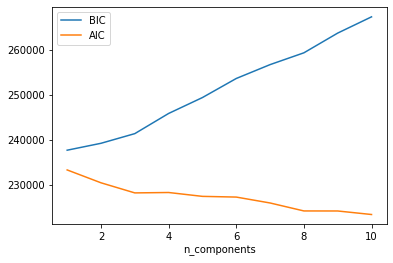

In [36]:
n_components = np.arange(1, 11)
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(x_input)
          for n in n_components]

plt.plot(n_components, [m.bic(x_input) for m in models], label='BIC')
plt.plot(n_components, [m.aic(x_input) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

In [37]:
gmm = GaussianMixture(3, covariance_type='spherical',random_state=0)
gmm.fit(x_input)
y_gmm = gmm.predict(x_input)

In [38]:
y_gmm.shape

(18956,)

In [39]:
y_proba = gmm.predict_proba(x_input).round(3)
np.max(y_proba,axis = 1)

array([0.967, 1.   , 1.   , ..., 0.957, 0.999, 0.994])

In [40]:
embedding_labels["y_gmm"] = y_gmm
embedding_labels["gmm_proba"] = np.max(y_proba,axis = 1)
embedding_labels.head()

,word,pca_1,pca_2,tsne_1,tsne_2,y_kmeans,kmeans_0,kmeans_1,kmeans_2,y_gmm,gmm_proba
0,0,1.112591,0.055564,-19.742430,21.073124,2,1.600232,1.721989,1.536465,2,0.967
1,<unk>,-1.310599,-2.402914,-1.655326,-17.002113,1,1.585816,1.441215,1.651783,2,1.000
2,<pad>,-0.831395,2.488738,-29.481033,-11.448477,0,1.504482,1.536359,1.657100,2,1.000
3,<sos>,0.970848,-1.272896,-1.095259,18.612560,2,1.197504,1.372915,1.169461,2,0.985
4,<eos>,-0.295743,0.153672,3.669761,-5.560215,0,0.890274,0.919514,0.996552,2,1.000


In [41]:
embedding_labels.gmm_proba.describe()

count    18956.000000
mean         0.958432
std          0.093908
min          0.501000
25%          0.977000
50%          0.997000
75%          0.999000
max          1.000000
Name: gmm_proba, dtype: float64

#### Visualize GMM cluster with T-SNE

In [42]:
import plotly.express as px

fig = px.scatter(embedding_labels, x="tsne_1", y="tsne_2", size_max=60,
                 hover_name="word",hover_data=['y_gmm','gmm_proba'], color=y_gmm)

fig.update_traces(textposition='top center')

fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=16, 
        font_family="Rockwell"
    )
)


fig.show()

#### Visualize GMM cluster with PCA

In [43]:
import plotly.express as px

fig = px.scatter(embedding_labels, x="pca_1", y="pca_2", size_max=60,
                 hover_name="word",hover_data=['y_gmm','gmm_proba'], color=y_gmm)

fig.update_traces(textposition='top center')

fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=16, 
        font_family="Rockwell"
    )
)


fig.show()

#### Conclusion GMM

With GMM, spherical works much better. With probably of a prediction included, this may be much better at recognizing words

#### Save the data into a file

In [44]:
embedding_labels.to_csv(data_folder + "/embedding_results.csv",index=False)

In [45]:
embedding_labels.shape

(18956, 11)

In [46]:
data_folder

'/content/drive/My Drive/tweet-sentiment-extraction/data'